# Introduction to Pixtral Large: A Frontier Multimodal AI Model

Pixtral Large represents a significant advancement in multimodal AI technology, combining sophisticated image understanding capabilities with powerful language processing. Built upon the foundation of Mistral Large 2, this 124B parameter model (123B multimodal decoder + 1B parameter vision encoder) demonstrates exceptional performance across various visual and textual understanding tasks while maintaining a substantial 128K context window that can accommodate at least 30 high-resolution images.

## Model Architecture and Capabilities

- Total Parameters: 124B
- Multimodal Decoder: 123B
- Vision Encoder: 1B
- Context Window: 128K
- Image Capacity: up to 30 images per request

## Benchmark Performance from Mistral

The model has achieved state-of-the-art results across several key benchmarks:

### MathVista:

- Achieved 69.4% accuracy
- Leads in complex mathematical reasoning over visual data
- Outperforms all other current models

### Document and Chart Understanding:

- Superior performance on ChartQA and DocVQA
- Exceeds capabilities of GPT-4o and Gemini-1.5 Pro

### MM-MT-Bench:

- Outperforms Claude-3.5 Sonnet (new)
- Surpasses Gemini-1.5 Pro and GPT-4o
- Demonstrates strong real-world application capabilities

### LMSys Vision Leaderboard:

- Leading open-weights model
- Surpasses nearest competitor by approximately 50 ELO points
- Outperforms various proprietary models, including GPT-4o (August '24)



In [1]:
from IPython.display import display, Image as IPImage
import boto3
import json

In [2]:
def get_mistral_response(prompt_text, image_path=None, show_image=True, temperature=0.6):
    
    model_id = "us.mistral.pixtral-large-2502-v1:0"
    bedrock_client = boto3.client("bedrock-runtime", region_name="us-east-1")


    image_paths = image_path if isinstance(image_path, list) else [image_path] if image_path else []

    if image_paths and show_image:
        for img_path in image_paths:
            print("Input Image:\n")
            display(IPImage(filename=img_path))
            print("\n")

    # Initialize message content with prompt text
    message_content = [{"text": prompt_text}]

    # Add images to content if provided
    if image_paths:
        for img_path in image_paths:
            image_ext = img_path.split(".")[-1]

            if (image_ext.lower() == 'jpg'):
                image_ext = 'jpeg'

            with open(img_path, "rb") as f:
                image = f.read()
            
            message_content.append({
                "image": {
                    "format": image_ext,
                    "source": {"bytes": image}
                }
            })

    message = {
        "role": "user",
        "content": message_content
    }

    try:
        response = bedrock_client.converse(
            modelId=model_id,
            messages=[message],
            inferenceConfig={
                "temperature": temperature
            }
        )

        output_message = response['output']['message']
        content_blocks = output_message['content']
        result_text = "\n".join(f"{block['text']}" for block in content_blocks)
        return result_text

    except Exception as err:
        return f"A client error occurred: {err}"

## Exploring Use Cases

Let's start with a simple image captioning and translation task.

Input Image:



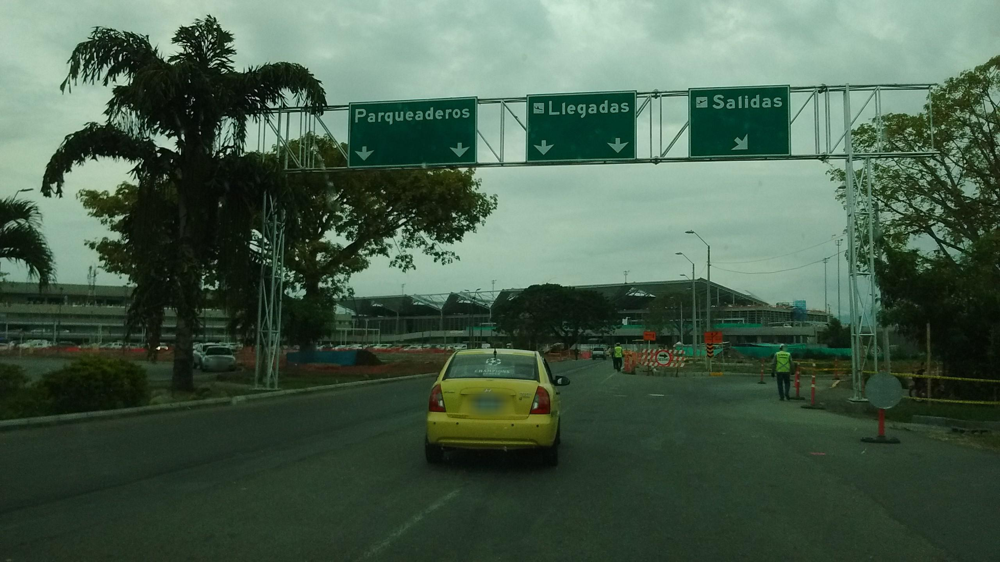




Model Response:
The image shows a road intersection with overhead directional signs. Here are the transcriptions and translations of the visible text:

1. **Parqueaderos**
   - Translation: Parking

2. **Llegadas**
   - Translation: Arrivals

3. **Salidas**
   - Translation: Departures

Additionally, there is a yellow taxi in the image, and the visible part of its text reads "Taxi".

There are also construction barriers with text that is partially visible, but the text on them is not clear enough to transcribe or translate accurately.


In [3]:
prompt = "Extract, transcribe, and translate all text visible in the image."
image_path = "Pixtral_data/airport_lanes.jpeg"
response = get_mistral_response(prompt, image_path)

print("\nModel Response:")
print(response)

## Understanding Database Schema

Input Image:



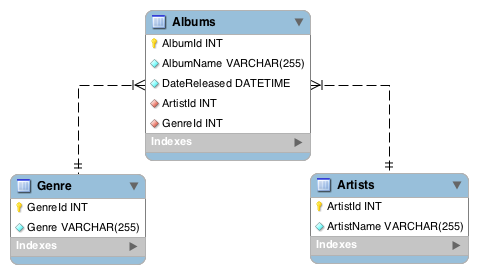




Model Response:
This database schema illustrates the relationships between three main entities: Albums, Artists, and Genre. Here is a detailed breakdown of the schema:

### Main Entities
1. **Albums**:
    - **Attributes**:
        - AlbumId (INT)
        - AlbumName (VARCHAR(255))
        - DateReleased (DATETIME)
        - ArtistId (INT)
        - GenreId (INT)
    - **Indexes**: Unspecified, but typically on primary keys and foreign keys.

2. **Artists**:
    - **Attributes**:
        - ArtistId (INT)
        - ArtistName (VARCHAR(255))
    - **Indexes**: Unspecified, but typically on primary keys.

3. **Genre**:
    - **Attributes**:
        - GenreId (INT)
        - Genre (VARCHAR(255))
    - **Indexes**: Unspecified, but typically on primary keys.

### Relationships
1. **Albums and Artists**:
    - The Albums table has a foreign key `ArtistId` that references the `ArtistId` in the Artists table.
    - This indicates a **many-to-one** relationship: Many albums can be associated

In [4]:
prompt = """Explain the relationships in this database schema:
- What are the main entities?
- How are they connected?
- What type of relationships exist between tables (one-to-many, many-to-many)?"""
image_path = "Pixtral_data/database-schema.png"
response = get_mistral_response(prompt, image_path)

print("\nModel Response:")
print(response)

## Chart Understanding & Reasoning

Input Image:



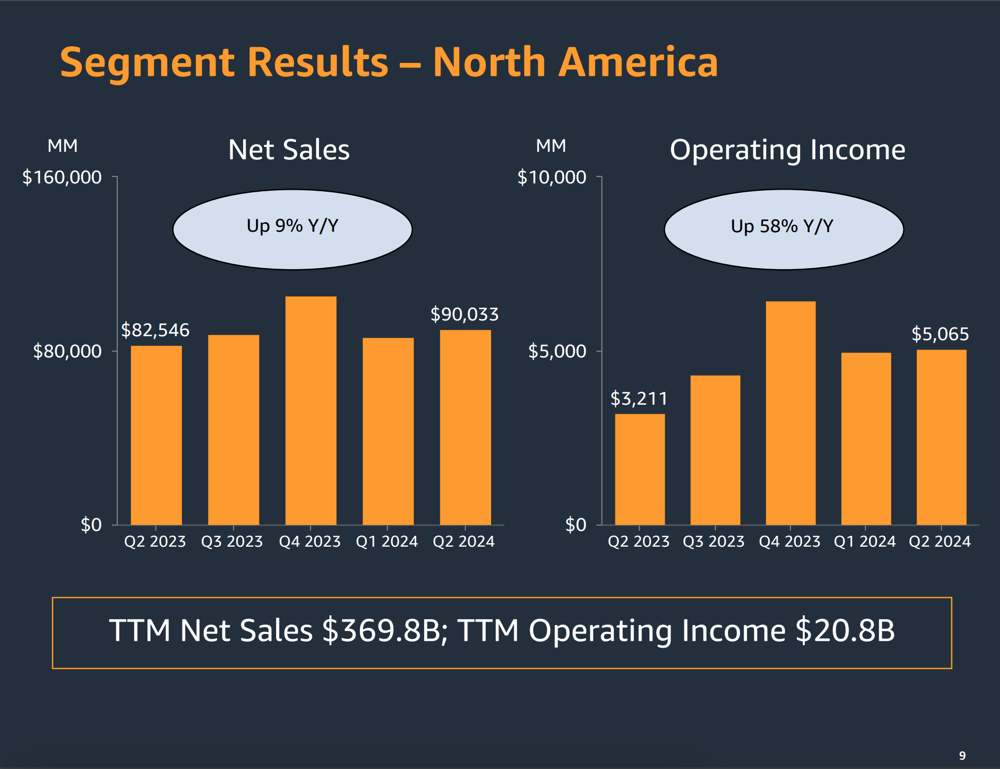




Model Response:
### Chart Analysis

#### Chart Type:
The image displays two bar charts side by side.

#### Key Data Points:

**Net Sales:**
- Q2 2023: $82,546 million
- Q3 2023: Approximately $87,000 million
- Q4 2023: Approximately $92,000 million
- Q1 2024: $90,033 million
- Q2 2024: $90,000 million

**Operating Income:**
- Q2 2023: $3,211 million
- Q3 2023: Approximately $3,500 million
- Q4 2023: Approximately $6,500 million
- Q1 2024: Approximately $5,000 million
- Q2 2024: $5,065 million

**Additional Information:**
- TTM (Trailing Twelve Months) Net Sales: $369.8 billion
- TTM Operating Income: $20.8 billion

#### Main Trends and Observations:
- **Net Sales:** There is a general upward trend in net sales from Q2 2023 to Q4 2023, with a slight decline in Q1 2024 and Q2 2024. The year-over-year increase is noted as 9%.
- **Operating Income:** There is a significant increase in operating income from Q2 2023 to Q4 2023, followed by a decline in Q1 2024 and a slight increase in Q2 

In [6]:
prompt = """Analyze the attached image of the chart or graph. Your tasks are to:

Identify the type of chart or graph (e.g., bar chart, line graph, pie chart, etc.).
Extract the key data points, including labels, values, and any relevant scales or units.
Identify and describe the main trends, patterns, or significant observations presented in the chart.
Generate a clear and concise paragraph summarizing the extracted data and insights. The summary should highlight the most important information and provide an overview that would help someone understand the chart without seeing it.
Ensure that your summary is well-structured, accurately reflects the data, and is written in a professional tone.

Then you need to analyze the following image and answer the following questions: 

-Which quarter had the highest net sales and which quarter had the lowest?
-What was the average net sale across quarters?
-What was the Q2 2024 & Q2 2025 net sales combined?
-Which quarter had the highest operating income and which quarter had the lowers?
-What was the average operating income across quarters?
-What was the Q2 2024 & Q2 2025 operating income combined?
"""
image_path = "Pixtral_data/Amazon_Chart.png"
response = get_mistral_response(prompt, image_path)

print("\nModel Response:")
print(response)

Input Image:



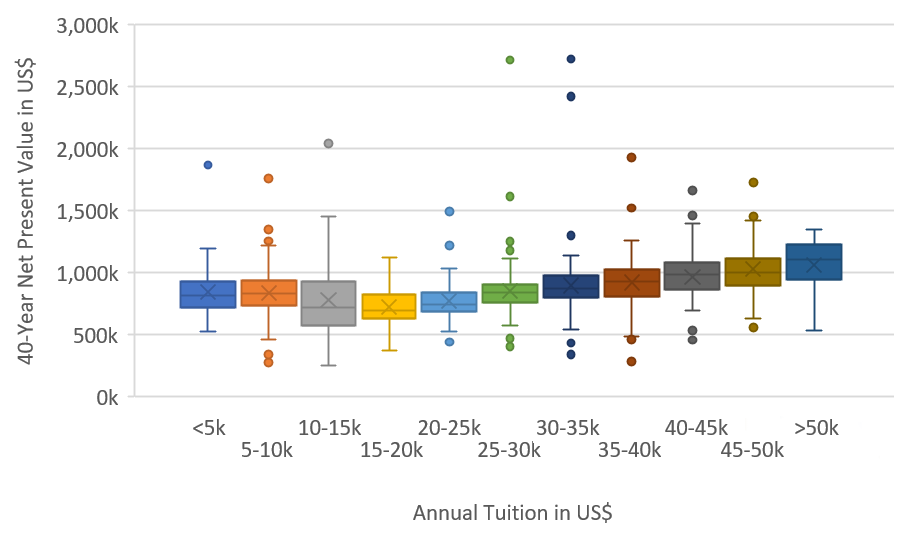




Model Response:
1. **Information Shown**:
   The box plots display the 40-year net present value (NPV) in US dollars of educational investments across different annual tuition cost categories. The x-axis represents the annual tuition costs in US dollars, divided into ranges (<5k, 5-10k, 10-15k, etc.), while the y-axis shows the 40-year net present value in US dollars. Each box plot visually summarizes the distribution of NPV for each tuition cost range.

   **Overall Pattern**:
   There does not seem to be a strong linear relationship between tuition cost and NPV. The medians and spreads vary across categories without a clear increasing or decreasing trend.

2. **Distribution Characteristics**:
   - **Components of Each Box**:
     - The boxes represent the interquartile range (IQR), which shows the middle 50% of the data.
     - The horizontal line within each box is the median.
     - The whiskers extend to the minimum and maximum values, excluding outliers.
     - Outliers are sh

In [7]:
prompt = """ Analyze this box plot visualization. Specifically:

1. Describe what information is being shown through these box plots and explain the overall pattern across categories.

2. Analyze the distribution characteristics shown by each box:
   - What do the different components of each box tell us?
   - How do the medians compare across categories?
   - What can we learn from the whiskers and any outliers?

3. Compare the spread and variability between different categories:
   - Which categories show the most/least variation?
   - Are there any notable patterns in the data dispersion?

4. Looking at the progression across categories:
   - What trends or patterns emerge?
   - Are there any unexpected relationships?

5. What broader conclusions can we draw about these relationships in the US education system?"""
image_path = "Pixtral_data/40_Year_Net_Present_Value_of_4-Year_Colleges_by_Tuition_in_the_United_States.png"
response = get_mistral_response(prompt, image_path)

print("\nModel Response:")
print(response)

By Stilfehler - Own work, CC BY-SA 4.0, https://commons.wikimedia.org/w/index.php?curid=85024061

Input Image:



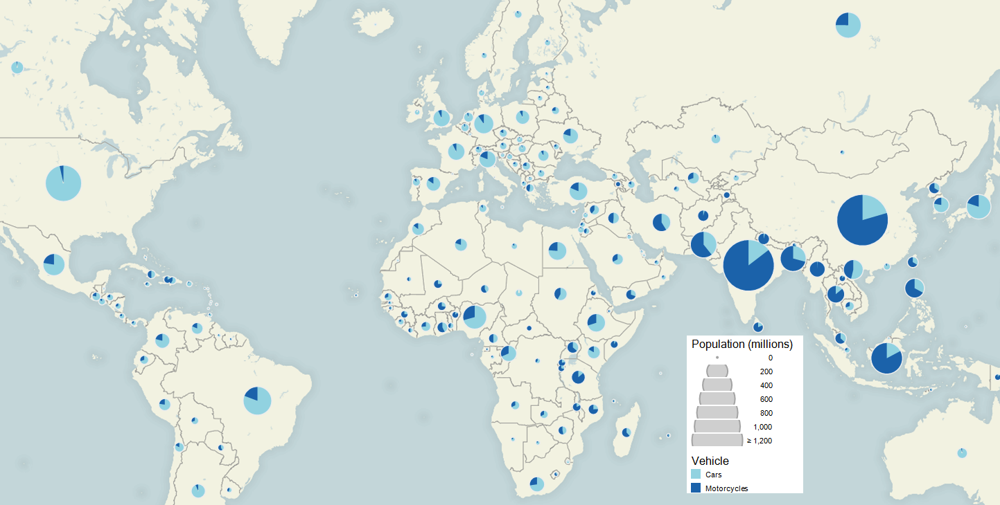




Model Response:
This visualization is a global map that shows the distribution of two types of vehicles (cars and motorcycles) across various countries. The data is represented using pie charts placed on each country, with the size of the pie chart indicating the population in millions. The segments of the pie charts are color-coded: light blue for cars and dark blue for motorcycles. The size of the pie chart is proportional to the population of the country, with larger charts representing higher populations.

### Analysis of Specific Patterns:

1. **Region with the highest proportion of the first category (cars)**:
   - North America, particularly the United States, shows a significant proportion of cars.

2. **Region with the highest proportion of the second category (motorcycles)**:
   - Southeast Asia, especially countries like Indonesia and Vietnam, have a high proportion of motorcycles.

3. **Largest total values**:
   - The largest pie charts, indicating the highest populatio

In [9]:
prompt = """Examine this visualization:

1. First, describe what this visualization represents:
   - What information is being shown?
   - How is the data displayed?
   - What do the different components represent?
   - What does the size variation indicate?

2. Analyze specific patterns:
   - Which region shows the highest proportion of the first category?
   - Which region shows the highest proportion of the second category?
   - Where do you observe the largest total values?
   - Which areas show the most balanced distribution?

3. Compare regional trends:
   - How do the proportions differ between continents?
   - What patterns emerge between different hemispheres?
   - Are there clear differences between different economic zones?

4. Identify interesting outliers:
   - Which regions stand out from their neighbors?
   - Can you identify any unexpected patterns?
   - Where do you notice significant data variations?

5. Consider geographical and demographic factors:
   - How might local conditions influence these patterns?
   - What socioeconomic factors might explain the variations?
   - Can you identify any correlation between size and proportions?

6. Make comparisons between:
   - Different geographical zones
   - Various population densities
   - Different economic development levels"""
image_path = "Pixtral_data/Map_Motorcycles_vs_cars_by_population_millions_2002.png"
response = get_mistral_response(prompt, image_path)

print("\nModel Response:")
print(response)

By Dennis Bratland - Own work, CC BY-SA 3.0, https://commons.wikimedia.org/w/index.php?curid=15186498

## Understanding Weather Patterns

Dust RGB satellite imagery helps meteorologists track dust storms and monitor atmospheric conditions. This example demonstrates the model's ability to interpret specialized weather visualizations, identifying dust concentrations (pink/magenta), water clouds (blue/black), and other atmospheric features from NOAA satellite data.

Input Image:



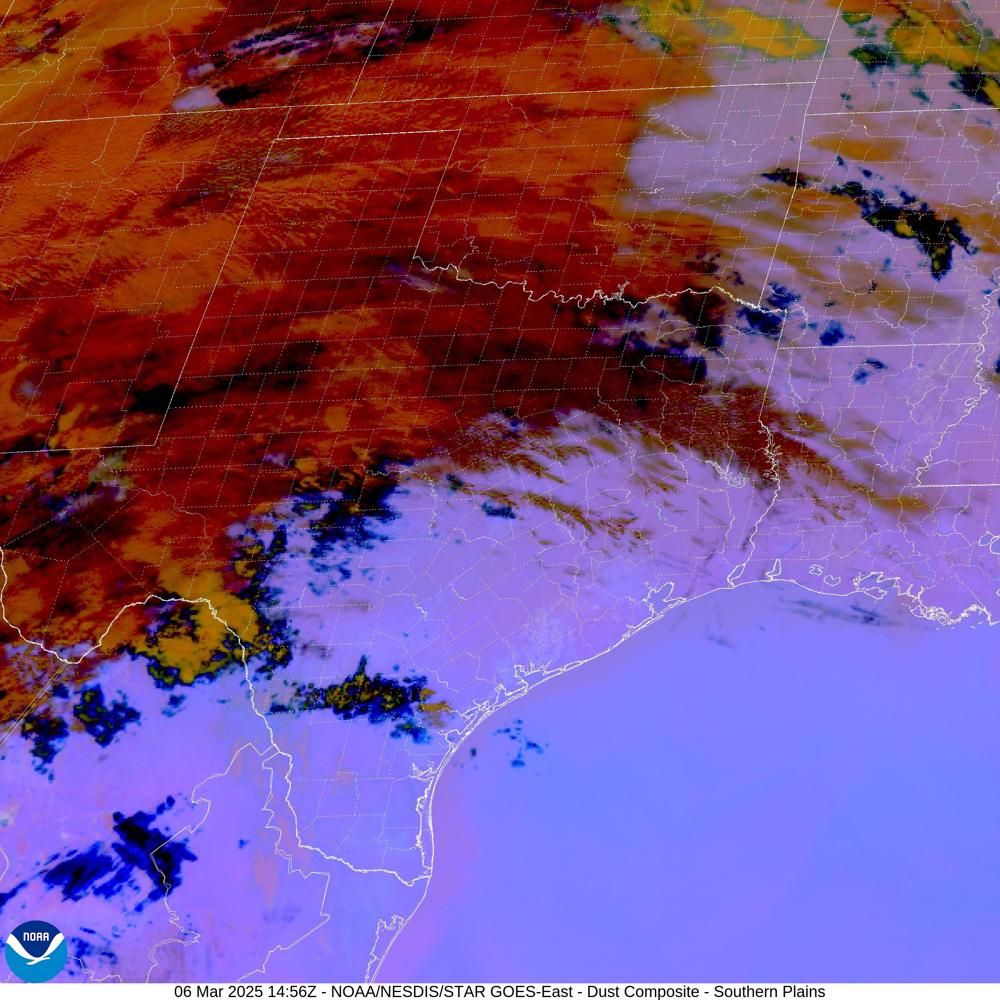




Model Response:
1. **Weather Patterns or Phenomena Visible:**
   The image depicts a dust RGB (Red, Green, Blue) composite from a satellite, showing weather patterns and phenomena over the Southern Plains of the United States. The image suggests the presence of dust and possibly other aerosols in the atmosphere. The primary visible phenomenon is the presence of dust clouds, which are common in arid regions or during dry, windy conditions.

2. **Colors and Their Indications:**
   - **Red/Orange Hues:** These colors typically indicate the presence of dust in the atmosphere. The varying shades of red and orange represent different concentrations and heights of dust particles.
   - **Yellows and Light Browns:** These colors can also signify dust but may indicate lower concentrations or different particle sizes compared to the red/orange areas.
   - **Blue and White Areas:** These colors often represent cloud formations. Blue typically indicates thicker, higher-altitude clouds, while whi

In [11]:
prompt = """Analyze this dust RGB satellite image and describe:
1. What weather patterns or phenomena are visible
2. Identify the colors and explain what they typically indicate
3. Point out any notable atmospheric features or dust concentrations
4. Describe the geographical regions affected"""
image_path = "Pixtral_data/texas_noaa_image.jpeg"
response = get_mistral_response(prompt, image_path)
print("\nModel Response:")
print(response)

## VFR Aeronautical Chart Analysis

Visual Flight Rules (VFR) aeronautical charts are essential tools for aviation navigation and flight planning. These charts contain complex layers of information including airspace classifications, terrain features, navigational aids, and airport data. This notebook explores the capabilities of multimodal AI models to understand, analyze, and reason about the various elements present in VFR charts.

The following analysis examines key components of a VFR chart to test comprehension of aeronautical symbols, spatial relationships, and aviation-specific features.


Attribution: By Federal Aviation Administration, VFR Raster Charts. Retrieved 2022-03-24. - https://www.faa.gov/air_traffic/flight_info/aeronav/digital_products/vfr/, Public Domain, https://commons.wikimedia.org/w/index.php?curid=116720288

Input Image:



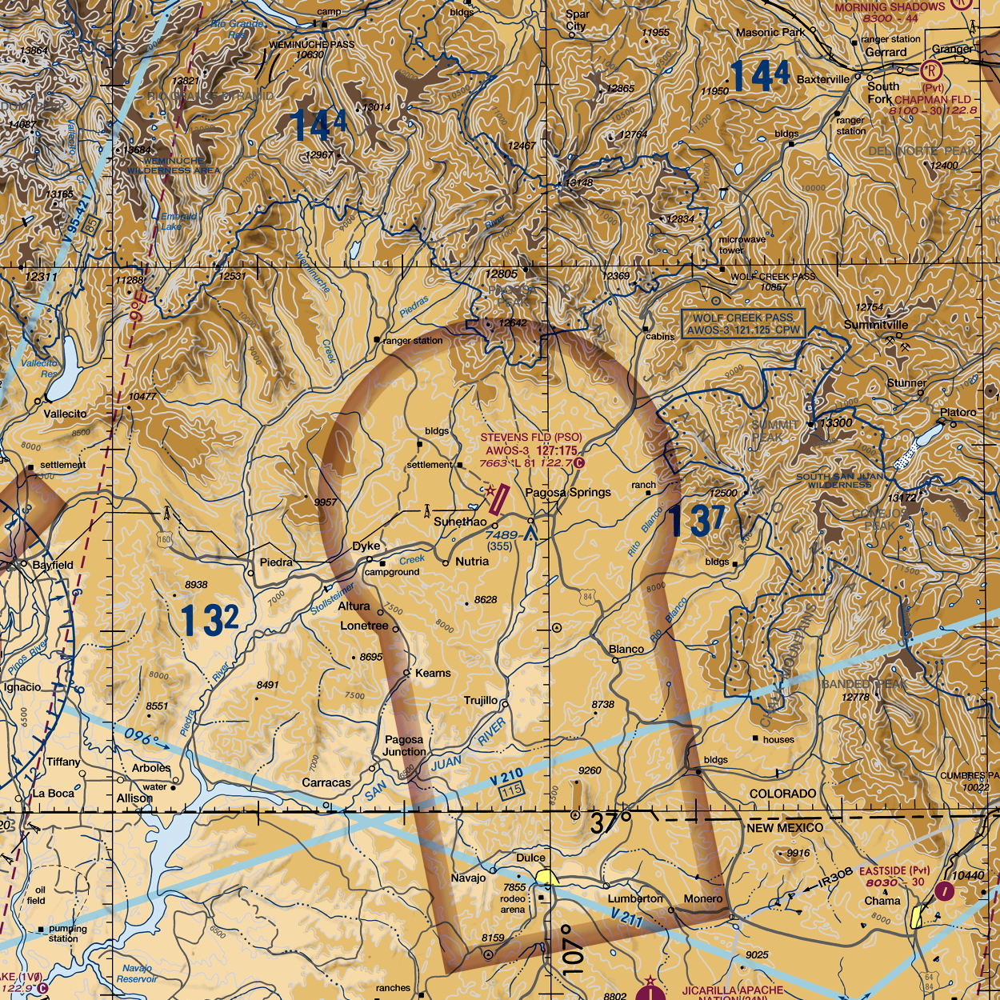




Model Response:
Let's break down the analysis of this VFR (Visual Flight Rules) aeronautical chart step-by-step.

1. **Key Aeronautical Symbols and Features:**

   - **Airports:**
     - Stevens Field (PSO) is located near the center of the map, at an elevation of 7663 feet.
     - Wolf Creek Pass Airport (3V2) is located to the northeast, at an elevation of 9747 feet.
     - Both airports are marked with typical airport symbols, including runway orientation and length.

   - **Navigational Aids:**
     - Stevens Field has an Automated Weather Observing System (AWOS-3), operating at frequency 127.175.
     - Wolf Creek Pass has an AWOS as well, operating at frequency 123.075.
     - The chart includes VOR (VHF Omnidirectional Range) stations such as DUC (Durango) to the west and MGE (Montezuma) to the southwest.

   - **Airspace Boundaries:**
     - No specific controlled airspace boundaries (like Class B, C, D, or E) are shown on this section of the map. This area appears to be pre

In [15]:
prompt = """Looking at this VFR aeronautical chart:

First, identify and explain the key aeronautical symbols and features visible on this map. Pay particular attention to airports, navigational aids, and airspace boundaries.

Based on the airspace classifications shown, analyze the different types of controlled and uncontrolled airspace in this section. What are the ceiling and floor altitudes for each?

Identify and describe the major landmarks, both natural and man-made, that could serve as visual reference points for navigation. How do these correlate with the navigational aids shown?

Provide a detailed analysis of the terrain and obstacle information. What are the highest points, and how does this affect minimum safe altitudes for VFR flight?

If you were planning a route through this area, what would be your primary and alternate navigation considerations, taking into account all the elements you've identified above?

Please support your analysis with specific references to features and locations on the map."""
image_path = "Pixtral_data/Stevens_Field_VFR_Map_(2022).jpeg"
response = get_mistral_response(prompt, image_path)

print("\nModel Response:")
print(response)

## Visual Design to Code Translation

This example tests the model's ability to translate a UI design into functional HTML and CSS code. The generated code is rendered below to validate how accurately the model interpreted and implemented the visual design elements.

By Cnbrb - Own work, CC BY-SA 4.0, https://commons.wikimedia.org/w/index.php?curid=128062961

Input Image:



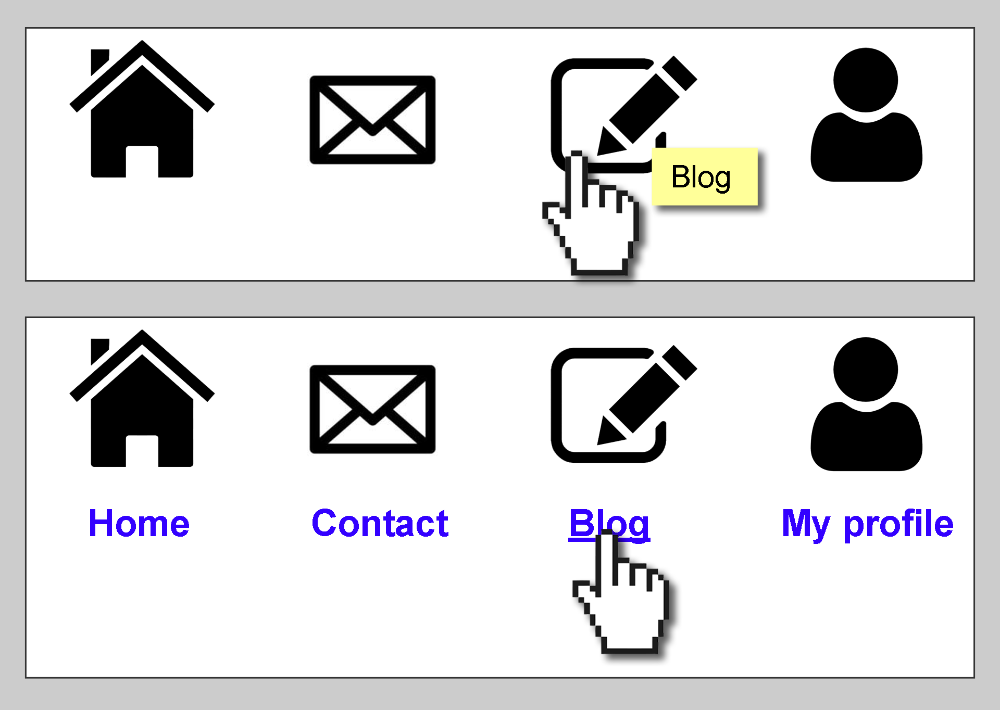




Model Response:
Certainly! Let's break down the UI design and then create the corresponding HTML and CSS.

### 1. UI Elements Observation

- Components Present:
  - Icons for Home, Contact, Blog, and My profile.
  - Text labels for Home, Contact, Blog, and My profile.
  - A mouse cursor hovering over the Blog icon.
  
- Arrangement:
  - The icons and text labels are horizontally aligned.
  - There are two rows: the first with only icons and the second with both icons and text labels.
  
- Visual Hierarchy:
  - Icons are visually prominent.
  - Text labels are below the icons in the second row.
  - A tooltip appears on hover for the Blog icon in the first row.

### 2. HTML Structure

```html
<!DOCTYPE html>
<html lang="en">
<head>
    <meta charset="UTF-8">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <title>Navigation Bar</title>
    <link rel="stylesheet" href="styles.css">
</head>
<body>
    <nav class="navbar">
        <ul class="nav-icons">
    

In [17]:
prompt = """

Analyze this UI design and:

1. First describe what UI elements you observe:
   - What components are present?
   - How are they arranged?
   - What is their visual hierarchy?

2. Generate the HTML structure that would create this layout:
   - Use semantic HTML elements
   - Maintain proper nesting
   - Include appropriate class names

3. Provide the CSS needed to:
   - Position elements correctly
   - Match visual styling
   - Handle hover states
   - Implement spacing/layout

4. Explain any design patterns or best practices you've incorporated in the code."""
image_path = "Pixtral_data/Iconographic_navigation_comparison.png"
response = get_mistral_response(prompt, image_path)

print("\nModel Response:")
print(response)

Input Image:



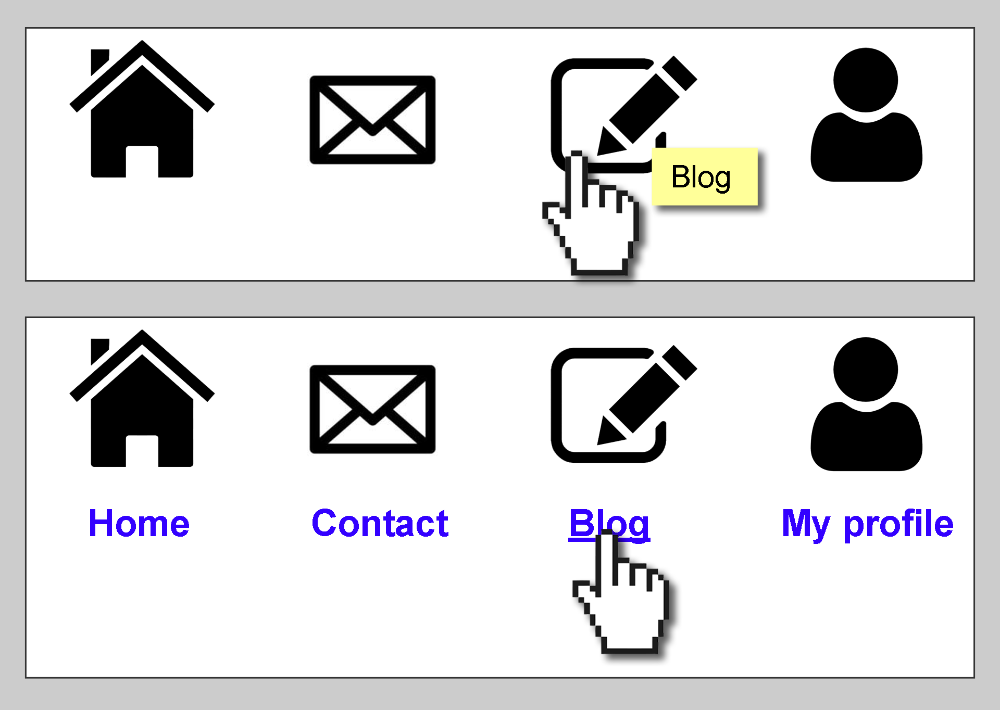

In [21]:
from IPython.display import HTML, display

# Get model response
response = get_mistral_response(prompt, image_path)


def extract_code(response):
    # Extract HTML - looking for content between ```html and ```
    html_start = response.find("```html")
    html_end = response.find("```", html_start + 7)  # Start looking after ```html
    html_code = response[html_start + 7:html_end].strip() if html_start != -1 else ""
    
    # Extract CSS - looking for content between ```css and ```
    css_start = response.find("```css")
    css_end = response.find("```", css_start + 7)  # Start looking after ```css
    css_code = response[css_start + 7:css_end].strip() if css_start != -1 else ""
    
    return html_code, css_code

try:
    html_code, css_code = extract_code(response)
    
    # Combine and display rendered result
    combined_code = f"""
    <div id="model-generated-ui">
        <style>
        #model-generated-ui {{
            border: 1px solid #ccc;
            padding: 20px;
            margin: 20px;
            max-width: 800px;
        }}
        {css_code}
        </style>
        {html_code}
    </div>
    """
    
    # Display rendered result
    display(HTML(combined_code))

except Exception as e:
    print(f"Error occurred: {e}")

## Structured Data Extraction from Table Image

This example tests the model's ability to extract tabular information and convert it into structured JSON format. This demonstrates the model's capabilities in data parsing, structure recognition, and format conversion.

Input Image:



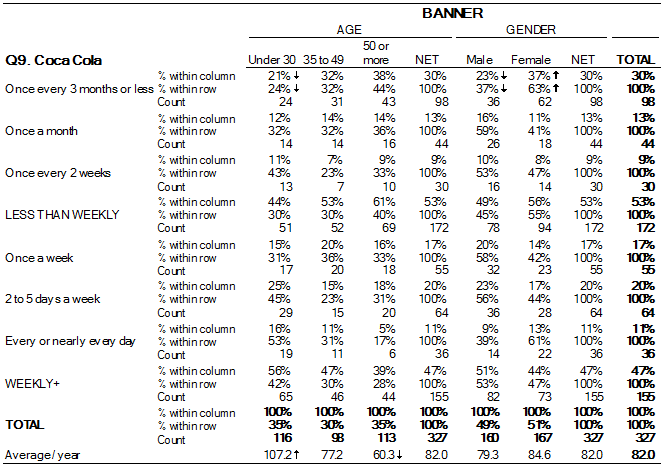




Model Response:
Sure, here is the table converted into a valid JSON structure:

```json
[
    {
        "Category": "Once every 3 months or less",
        "Age": {
            "Under 30": {
                "Percentage": 2,
                "Count": 24
            },
            "35 to 49": {
                "Percentage": 3,
                "Count": 31
            },
            "50 or more": {
                "Percentage": 3,
                "Count": 43
            },
            "NET": {
                "Percentage": 3,
                "Count": 98
            }
        },
        "Gender": {
            "Male": {
                "Percentage": 2,
                "Count": 36
            },
            "Female": {
                "Percentage": 3,
                "Count": 62
            },
            "NET": {
                "Percentage": 3,
                "Count": 98
            }
        }
    },
    {
        "Category": "Once a month",
        "Age": {
            "Under 30": {
  

In [24]:
prompt = """
Convert this table into a valid JSON structure:

- Identify and use column headers as keys
- Maintain proper data types (numbers, strings, etc.)
- Preserve any hierarchical relationships
- Format as an array of object"""
image_path = "Pixtral_data/Crosstab_of_Cola_Preference_by_Age_and_Gender.png"
response = get_mistral_response(prompt, image_path)

print("\nModel Response:")
print(response)

## SQL Statements from ER Diagram

An Entity-Relationship (ER) diagram is a visual representation used in database design to illustrate the relationships between entities and their attributes. It is a crucial tool for conceptual modeling, helping developers and analysts to understand and communicate the structure of data within a database. 
This example tests the model's ability to generate PosgreSQL compatible SQL CREATE TABLE statements for creating entities and their realationships.

Input Image:



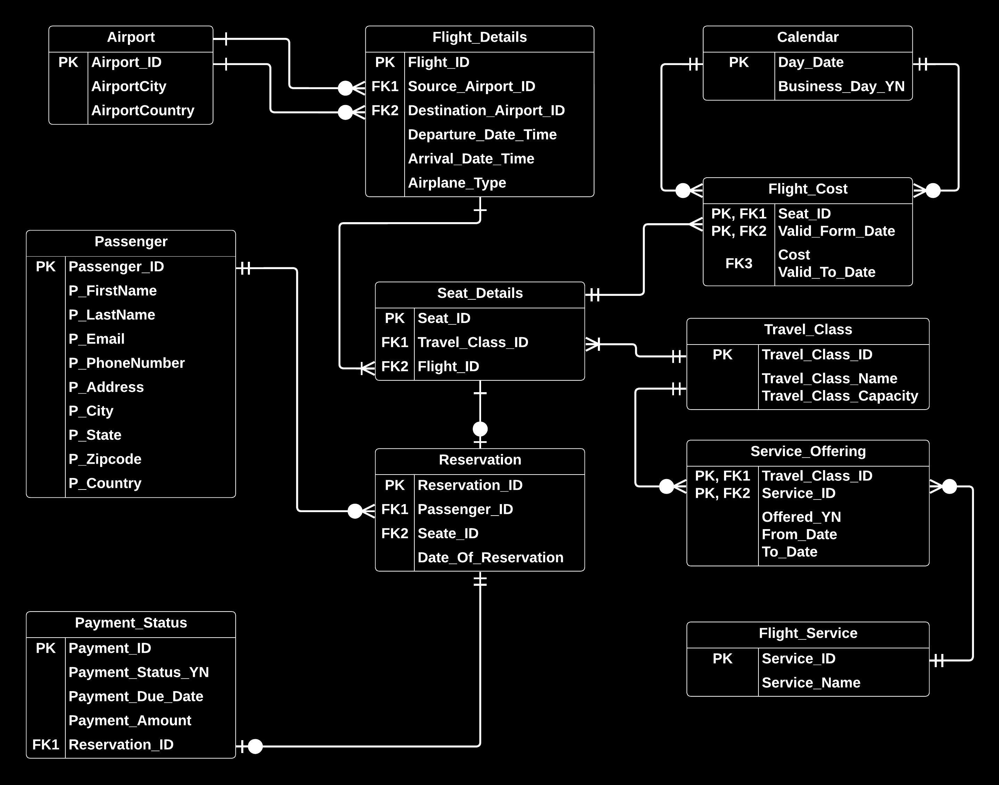




Model Response:
Sure, I can help you generate PostgreSQL compatible SQL statements to create the tables based on the provided ER diagram. Below are the SQL statements for each table shown in the ER diagram:

### 1. Airport Table
```sql
CREATE TABLE Airport (
    Airport_ID SERIAL PRIMARY KEY,
    AirportCity VARCHAR(255),
    AirportCountry VARCHAR(255)
);
```

### 2. Flight_Details Table
```sql
CREATE TABLE Flight_Details (
    Flight_ID SERIAL PRIMARY KEY,
    Source_Airport_ID INTEGER REFERENCES Airport(Airport_ID),
    Destination_Airport_ID INTEGER REFERENCES Airport(Airport_ID),
    Departure_Date_Time TIMESTAMP,
    Arrival_Date_Time TIMESTAMP,
    Airplane_Type VARCHAR(255)
);
```

### 3. Calendar Table
```sql
CREATE TABLE Calendar (
    Day_Date DATE PRIMARY KEY,
    Business_Day_YN CHAR(1)
);
```

### 4. Flight_Cost Table
```sql
CREATE TABLE Flight_Cost (
    Seat_ID SERIAL PRIMARY KEY,
    Flight_ID INTEGER REFERENCES Flight_Details(Flight_ID),
    Valid_From_Date DATE,
 

In [25]:
prompt = """
You are a database designer. You have created an ER diagram. You need to generate PostgreSQL compatible SQL statements to create the tables"

"""
image_path = "Pixtral_data/er-diagram.jpeg"
response = get_mistral_response(prompt, image_path)

print("\nModel Response:")
print(response)

## Multi Lingual Capabilities

Pixtral Large supports multiple languages. In this example, we test the model to extract information from a whiteboard in Hindi.

Input Image:



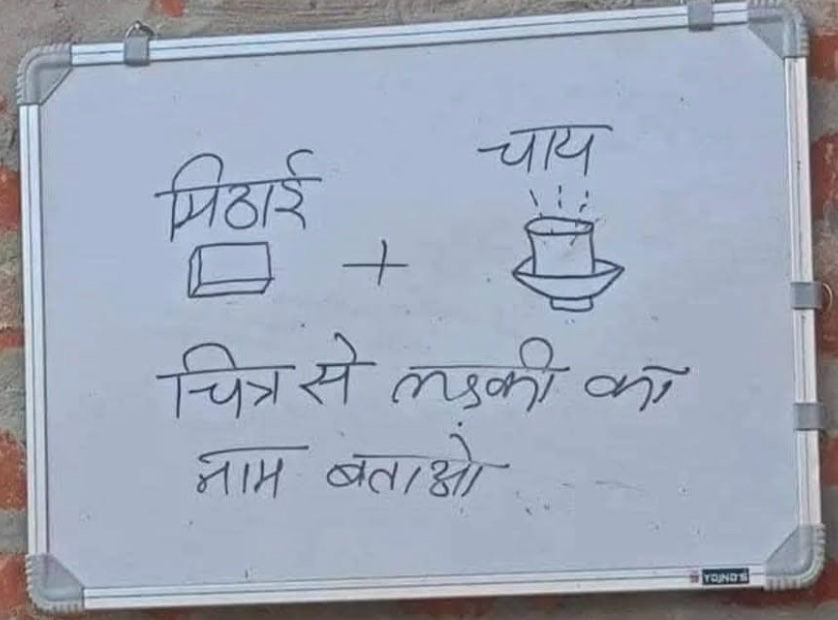




Model Response:
The riddle on the board is written in Hindi and translates to:

"Pizza (with a drawing of a box) + Tea (with a drawing of a cup of tea)
Pizza is hot, but it is not hot."

To solve this riddle, let's break it down:

1. The first part of the riddle shows a pizza (in a box) and a cup of tea.
2. The second part states that pizza is hot, but it is not hot.

The key to solving this riddle is to understand that the word "hot" is being used in two different contexts. In the first context, "hot" refers to the temperature of the pizza. In the second context, "hot" refers to something popular or trending.

So, the answer to the riddle is:

**"Pizza is popular (hot), but it is not hot (in temperature)."**

This play on words is what makes the riddle interesting and thought-provoking.


In [27]:
prompt = """
This is a viral riddle in hindi. Read each word and question. After that, think and solve the riddle.

"""
image_path = "Pixtral_data/hindi_teaser.jpeg"
response = get_mistral_response(prompt, image_path, temperature=0.1)

print("\nModel Response:")
print(response)

## Whiteboard Notes

Let's test the capabilities of Pixtral Large in reading handwritten notes from the whiteboard

Input Image:



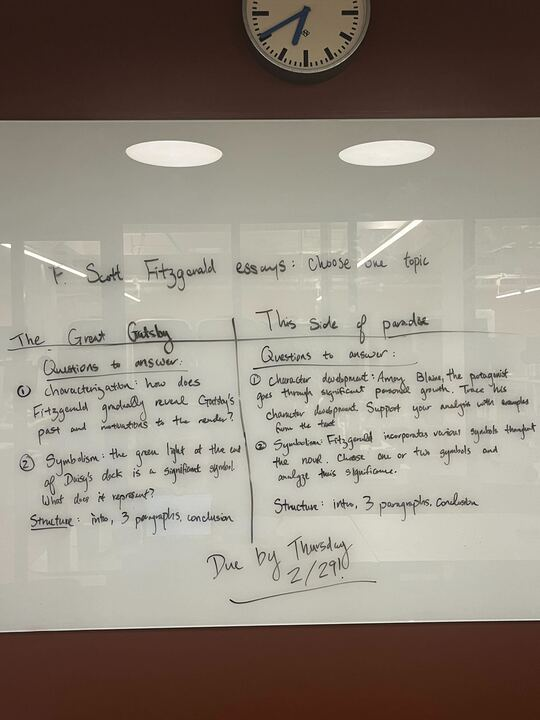




Model Response:
Sure, here is the categorized summary of the handwritten notes from the whiteboard:

### Essay Topics on F. Scott Fitzgerald's "The Great Gatsby"

#### Topic 1: Characterization
**Questions to Answer:**
1. Characterization: How does Fitzgerald gradually reveal Gatsby's past and motivations to the reader?

#### Topic 2: Symbolism
**Questions to Answer:**
2. Symbolism: The green light at the end of Daisy's dock is a significant symbol. What does it represent?

#### Topic 3: Character Development
**Questions to Answer:**
1. Character Development: Analyze Blair, the protagonist, and how he develops throughout significant pivotal points in the novel. Include specific examples from the text.

#### Topic 4: Symbolism
**Questions to Answer:**
2. Symbolism: Fitzgerald incorporates various symbols throughout the novel. Choose one or two symbols and analyze their significance.

### Structure
- Introduction
- 3 Paragraphs
- Conclusion

### Due Date
- Due by Thursday, 2/29/18

##

In [28]:
prompt = """
Read handwritten notes from the whiteboard and categorise these for further actions.

"""
image_path = "Pixtral_data/whiteboard.png"
response = get_mistral_response(prompt, image_path, temperature=0.1)

print("\nModel Response:")
print(response)

## Convert Org Hierarchy to Structured text

Input Image:



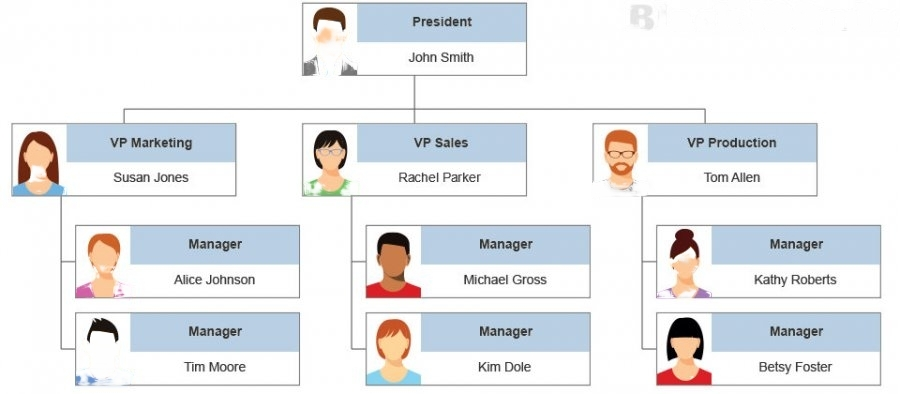




Model Response:
Here is the organization hierarchy extracted from the given org structure in a structured JSON format:

```json
[
    {
        "role": "President",
        "name": "John Smith",
        "reporting_manager": null
    },
    {
        "role": "VP Marketing",
        "name": "Susan Jones",
        "reporting_manager": "John Smith"
    },
    {
        "role": "VP Sales",
        "name": "Rachel Parker",
        "reporting_manager": "John Smith"
    },
    {
        "role": "VP Production",
        "name": "Tom Allen",
        "reporting_manager": "John Smith"
    },
    {
        "role": "Manager",
        "name": "Alice Johnson",
        "reporting_manager": "Susan Jones"
    },
    {
        "role": "Manager",
        "name": "Tim Moore",
        "reporting_manager": "Susan Jones"
    },
    {
        "role": "Manager",
        "name": "Michael Gross",
        "reporting_manager": "Rachel Parker"
    },
    {
        "role": "Manager",
        "name": "Kim Dole",
   

In [30]:
prompt = """
Extract organization hierarchy from the given org structure. provide response in a structured json format with below:
- role
- name
- reporting_manager

"""
image_path = "Pixtral_data/org_hierarchy.jpeg"
response = get_mistral_response(prompt, image_path, temperature=0.1)

print("\nModel Response:")
print(response)

## MathVista

Pixtral Large has demonstrated competitive capabilities on [MathVista](https://mathvista.github.io/), which is an advanced benchmarking platform designed to evaluate mathematical reasoning and problem-solving capabilities of LLMs, focusing on challenges from diverse mathematical and visual tasks. 

In this example, Mistral writes a trigonometric equation based on the sinusoidal pattern observed in the graph.

Input Image:



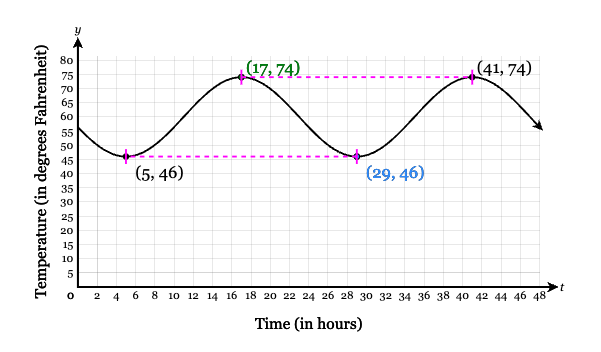




Model Response:
To identify the pattern and write an equation for the temperature \( y \) in terms of time \( t \), we need to analyze the given graph. The graph shows a sinusoidal pattern, which can be represented by a sine or cosine function.

1. **Identify the Amplitude and Vertical Shift:**
   - The temperature oscillates between a maximum of 74°F and a minimum of 46°F.
   - The amplitude \( A \) is half the difference between the maximum and minimum temperatures:
     \[
     A = \frac{74 - 46}{2} = 14
     \]
   - The vertical shift \( D \) is the average of the maximum and minimum temperatures:
     \[
     D = \frac{74 + 46}{2} = 60
     \]

2. **Identify the Period:**
   - The period \( T \) is the time it takes for the temperature to complete one full cycle. From the graph, the period is 24 hours.

3. **Identify the Phase Shift:**
   - The phase shift \( \phi \) can be determined by looking at where the sine wave crosses the vertical shift line. The temperature reaches 60°

In [32]:
prompt = """
During a certain time of year, the daily temperature in a certain city, 
in degrees Fahrenheit follows a periodic pattern.

Identify the pattern and write an equation in terms of y, temperature in degrees Fahrenheit, 
and t, time in hours, to represent the given context.
"""
image_path = "Pixtral_data/trig-equations-from-context.png"
response = get_mistral_response(prompt, image_path, temperature=0.1)

print("\nModel Response:")
print(response)

## Multilingual OCR and reasoning

The benchmarks used to evaluate reasoning capabilities over complex charts and documents include ChartQA and DocVQA, where Pixtral Large demonstrates leading performance. 

In this example, we explore multilingual OCR and reasoning capabilities. The task involves reading a restaurant receipt from Brazil written in Portuguese, identifying the items purchased, calculating the total cost with a tip added only to those items, and converting the total amount to USD based on the exchange rate at the time of purchase for expense reporting purposes.

Input Image:



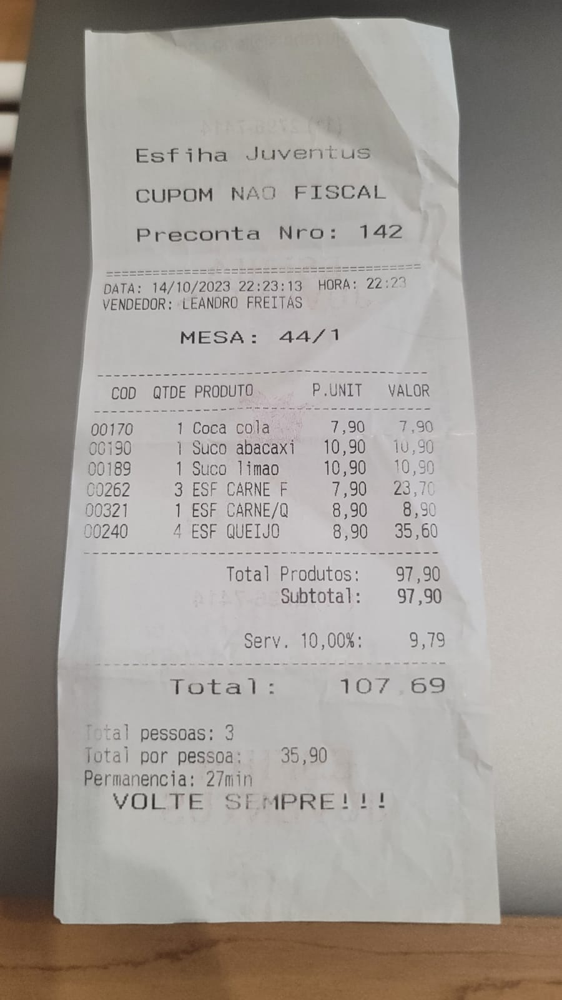




Model Response:
To calculate the amount in USD to expense in your report, follow these steps:

1. **Identify the items purchased and their costs:**
   - Suco abacaxi (Pineapple juice): 10.90 BRL
   - Esfiha carne (Middle Eastern meat pie): 8.90 BRL

2. **Calculate the total cost of the items:**
   - Total cost = 10.90 BRL + 8.90 BRL = 19.80 BRL

3. **Calculate the 20% tip:**
   - Tip = 20% of 19.80 BRL = 0.20 * 19.80 BRL = 3.96 BRL

4. **Calculate the total amount including the tip:**
   - Total amount = 19.80 BRL + 3.96 BRL = 23.76 BRL

5. **Determine the exchange rate on the receipt date (14/10/2023):**
   - As of October 14, 2023, the approximate exchange rate was 1 USD = 4.90 BRL (this rate can vary, so it's important to check the exact rate on that date).

6. **Convert the total amount in BRL to USD:**
   - Total amount in USD = 23.76 BRL / 4.90 BRL/USD ≈ 4.85 USD

Therefore, the amount in USD to expense in the report is approximately **4.85 USD**.


In [33]:
prompt = """
I bought a pineapple juice and one Middle Eastern meat pie. 
Add a 20% tip. What amount in USD should I expense in the report based 
on the exchange rate at the time of purchase? 
Use the receipt date to estimate the amount.
"""

image_path = "Pixtral_data/restaurant-receipt-brazil.jpeg"
response = get_mistral_response(prompt, image_path, temperature=0.1)

print("\nModel Response:")
print(response)

# Multimodal Product Analysis: Multiple Images in One Request

This notebook demonstrates how to analyze multiple product images using AI to generate structured data. We'll input product photos and receive detailed JSON output containing specifications, features, and comparative analysis - useful for product cataloging and market research.

Input Image:



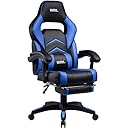



Input Image:



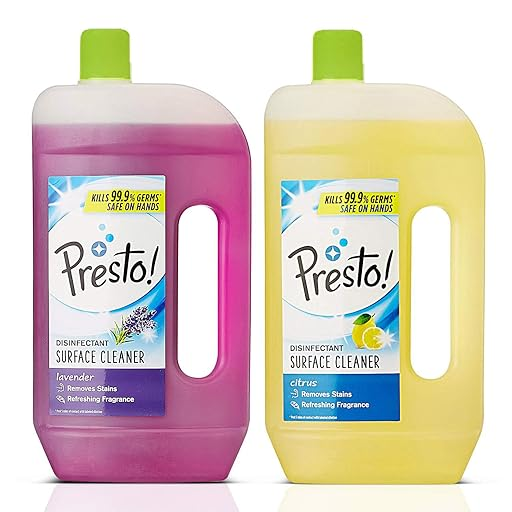



Input Image:



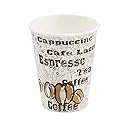




Model Response:
```json
{
    "products": [
        {
            "product_name": "Gaming Chair",
            "category": "Office Furniture",
            "key_features": [
                "Ergonomic design",
                "Adjustable height and recline",
                "Padded armrests",
                "Lumbar support cushion",
                "Headrest pillow",
                "Swivel base with wheels"
            ],
            "color_options": ["Blue and Black"],
            "materials": ["PU Leather", "Foam padding", "Plastic base", "Metal frame"],
            "estimated_price_range": "$100 - $200",
            "target_use_case": "Gaming, home office, extended computer use",
            "notable_design_elements": [
                "Racing-style design",
                "Contrasting color accents",
                "Contoured backrest for support"
            ],
            "comparable_to": "DXRacer, AKRacing gaming chairs"
        },
        {
            "product_name": "Pre

In [34]:
prompt = """Analyze these product images and provide a detailed product catalog entry for each item. 
Return the information in JSON format with the following structure for each product:

{
    "products": [
        {
            "product_name": "",
            "category": "",
            "key_features": [],
            "color_options": [],
            "materials": [],
            "estimated_price_range": "",
            "target_use_case": "",
            "notable_design_elements": [],
            "comparable_to": ""
        }
    ],
    "comparative_analysis": {
        "price_range_spread": "",
        "style_consistency": "",
        "target_market": "",
        "recommended_bundle_price": ""
    }
}

Be specific about design features, materials, and potential use cases. Include any unique selling points you observe."""

image_paths = [
    "Pixtral_data/chair.jpeg",
    "Pixtral_data/cleaner.jpeg",
    "Pixtral_data/coffee.jpeg"
]

response = get_mistral_response(prompt, image_paths, temperature=0.1)
print("\nModel Response:")
print(response)